In [1]:
### Import all the required libraries
import os
import sys

import pandas as pd
import numpy as np

import pymysql.cursors          
    
from matplotlib import pyplot as plt
get_ipython().magic(u'matplotlib inline')


import warnings
# Plotting libraries
import matplotlib.pyplot as plt
import seaborn as sns

import plotly

import plotly.figure_factory as ff
import plotly.plotly as py
import plotly.offline as pyoff
import plotly.graph_objs as go

# Initializing some settings
pyoff.init_notebook_mode(connected=True)
get_ipython().magic('matplotlib inline')

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot


In [2]:
#### For mysql connectivity
connection = pymysql.connect(host='172.16.0.224',
                             user='insofeadmin',
                             password='insofe_password',
                             db='insofe_results_2618B56',
                             charset='utf8mb4',
                             cursorclass=pymysql.cursors.DictCursor)

try:
    with connection.cursor() as cursor:
### Extract data from active_emp_details table

        query = "SELECT * FROM `active_emp_details`"
        cursor.execute(query)
        active_employees = cursor.fetchall()

### Extract data from dept_aggr_by_gender table
        query = "SELECT * FROM `dept_aggr_by_gender`"
        cursor.execute(query)
        dept_aggr_gender = cursor.fetchall()

### Extract data from dept_aggr table
        query = "SELECT * FROM `dept_aggr`"
        cursor.execute(query)
        dept_aggr_all = cursor.fetchall()
        #print(dept_aggr_all)
        
finally:
    connection.close()

In [3]:
os.getcwd()

'/Users/samyam/Documents/Samya/GIT/insofe/day43/BIonHadoop'

In [4]:
def make_go_bar(x,y,text = '',name= '',color= 'green'):
    return go.Bar(x=x,
                  y = y,
                  text = text,textposition = 'auto',
                 textfont=dict(
        family='sans serif',
        size=20,
        color='black'),
        marker=dict(
        color=color,
                      
        line=dict(
            color='black',
            width=1)),name= name,opacity=0.80)

In [5]:
active_employees_DF = pd.DataFrame(active_employees, columns=["emp_no", "first_name", "last_name", "gender", "birth_date", "hire_date", "dept_no", "dept_name", "dept_from_date", "salary", "salary_from_date", "title", "title_from_date", "manager_emp_no", "manager_first_name", "manager_last_name", "manager_gender", "manager_birth_date", "manager_hire_date", "manager_from_date", "age", "tenure", "manager_age", "manager_tenure", "salary_since", "role_since"])
dept_aggr_all_DF = pd.DataFrame(dept_aggr_all, columns=["dept_no", "dept_name", "tot_emp", "tot_sal", "min_sal", "max_sal", "avg_sal", "min_age", "max_age", "avg_age", "min_tenure", "max_tenure", "avg_tenure", "avg_sal_change", "avg_role_change"]) 
dept_aggr_gender_DF = pd.DataFrame(dept_aggr_gender, columns=["dept_no", "dept_name", "gender", "tot_emp", "tot_sal", "min_sal", "max_sal", "avg_sal", "min_age", "max_age", "avg_age", "min_tenure", "max_tenure", "avg_tenure", "avg_sal_change", "avg_role_change"])

In [6]:
active_employees_DF.head()

,emp_no,first_name,last_name,gender,birth_date,hire_date,dept_no,dept_name,dept_from_date,salary,...,manager_gender,manager_birth_date,manager_hire_date,manager_from_date,age,tenure,manager_age,manager_tenure,salary_since,role_since
0,1,Margareta,Markovitch,M,1958-09-12,1986-01-01,d001,Marketing,1986-01-01,107407,...,M,1967-06-21,1988-04-12,1993-10-01,60,33,51,31,16,26
1,2,Ebru,Alpin,M,1961-10-28,1986-01-01,d002,Finance,1986-01-01,87443,...,F,1959-03-28,1986-01-14,1990-12-17,57,33,60,33,16,28
2,3,Shirish,Ossenbruggen,F,1955-06-24,1986-01-01,d003,Human Resources,1986-01-01,78229,...,F,1960-12-02,1986-08-04,1993-03-21,63,33,58,32,16,26
3,4,Krassimir,Wegerle,F,1958-06-08,1986-01-01,d004,Production,1986-01-01,71583,...,M,1981-07-27,2001-02-05,2005-08-30,60,33,37,18,16,29
4,5,DeForest,Hagimont,M,1959-07-08,1986-01-01,d005,Development,1986-01-01,71903,...,F,1970-04-25,1989-10-21,1995-04-25,59,33,49,29,16,26


In [7]:
dept_aggr_all_DF

,dept_no,dept_name,tot_emp,tot_sal,min_sal,max_sal,avg_sal,min_age,max_age,avg_age,min_tenure,max_tenure,avg_tenure,avg_sal_change,avg_role_change
0,d001,Marketing,16764,1238164872,12501,144128,73858.56,24,66,45.97,2,33,20.14,9.53,14.52
1,d002,Finance,14551,1055490354,12701,141395,72537.31,24,66,45.73,2,33,19.62,9.35,14.19
2,d003,Human Resources,14854,886284732,12669,140953,59666.40,24,66,45.85,2,33,19.83,9.41,14.31
3,d004,Production,55256,3421642967,12568,137497,61923.46,24,67,46.96,2,33,21.67,10.08,15.80
4,d005,Development,63302,3898772520,12582,142434,61590.04,24,67,46.99,2,33,21.74,10.10,15.80
5,d006,Quality Management,16812,1028548494,12596,137308,61179.43,24,67,45.83,2,33,19.78,9.40,14.53
6,d007,Sales,39567,3243333478,12524,157220,81970.67,24,66,46.79,2,33,21.42,9.98,15.39
7,d008,Research,17423,1096827379,12817,137344,62952.84,24,67,46.07,2,33,20.20,9.56,14.64
8,d009,Customer Service,19591,1219572065,12505,142950,62251.65,24,67,46.20,2,33,20.39,9.62,14.73
9,d010,Analytics,4008,305829432,12567,137498,76304.75,24,49,36.06,2,6,3.82,3.82,3.82


In [8]:
dept_aggr_gender_DF

,dept_no,dept_name,gender,tot_emp,tot_sal,min_sal,max_sal,avg_sal,min_age,max_age,avg_age,min_tenure,max_tenure,avg_tenure,avg_sal_change,avg_role_change
0,d001,Marketing,F,6812,501514258,13110,137842,73622.18,24,66,45.59,2,33,19.62,9.33,14.13
1,d001,Marketing,M,9952,736650614,12501,144128,74020.36,24,66,46.23,2,33,20.50,9.66,14.79
2,d002,Finance,F,6068,442543181,13007,137300,72930.65,24,66,45.46,2,33,19.12,9.17,13.93
3,d002,Finance,M,8483,612947173,12701,141395,72255.94,24,66,45.93,2,33,19.99,9.48,14.39
4,d003,Human Resources,F,6129,368144837,12669,137321,60066.05,24,66,45.55,2,33,19.31,9.24,13.96
5,d003,Human Resources,M,8725,518139895,13320,140953,59385.66,24,66,46.07,2,33,20.19,9.54,14.56
6,d004,Production,F,22397,1386752146,13612,137497,61916.87,24,66,46.88,2,33,21.51,10.02,15.69
7,d004,Production,M,32859,2034890821,12568,137378,61927.96,24,67,47.01,2,33,21.77,10.11,15.86
8,d005,Development,F,25513,1571567883,12582,142434,61598.71,24,67,46.89,2,33,21.57,10.04,15.71
9,d005,Development,M,37789,2327204637,12876,137119,61584.18,24,67,47.05,2,33,21.86,10.15,15.86


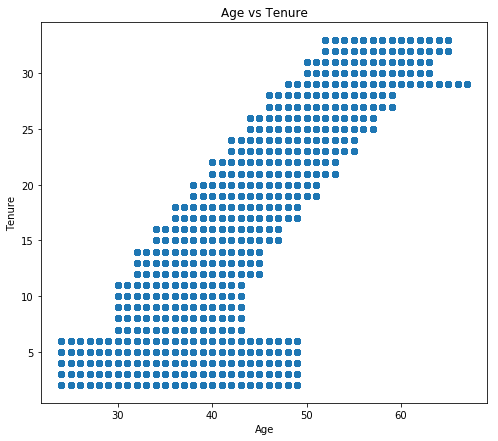

In [9]:
### Draw a scatter plot to identify the relation between employees age and tenure
# plt.scatter(active_employees_DF.age, active_employees_DF.tenure)
X = active_employees_DF.age
Y = active_employees_DF.tenure
plt.figure(figsize=(8,7))
plt.xlabel("Age")
plt.ylabel("Tenure")
plt.title("Age vs Tenure")
plt.scatter(X,Y)
plt.show()

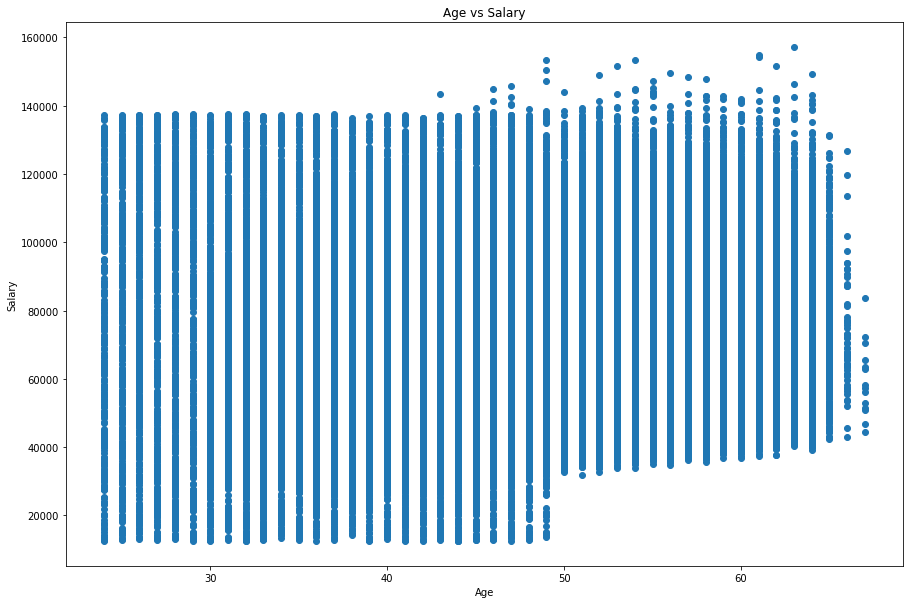

In [10]:
### Draw a scatter plot to identify the relation between employees age and salary
temp = active_employees_DF.sample(frac=1)
X = temp.age.astype(int)
Y = temp.salary.astype(int)
plt.figure(figsize=(15,10))
plt.xlabel("Age")
plt.ylabel("Salary")
plt.title("Age vs Salary")
plt.scatter(X,Y)
plt.show()

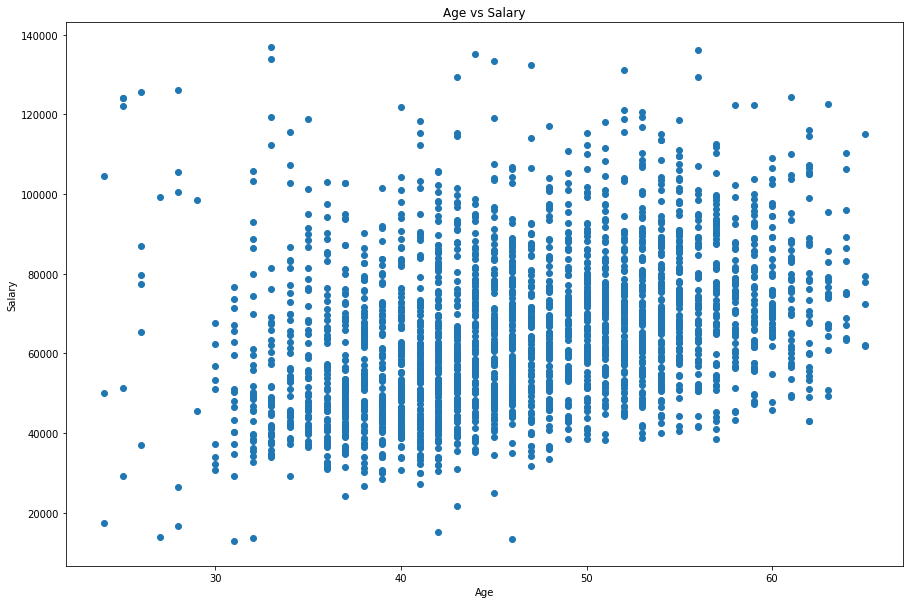

In [11]:
### Draw a scatter plot to identify the relation between employees age and salary
temp = active_employees_DF.sample(frac=0.01)
X = temp.age
Y = temp.salary
plt.figure(figsize=(15,10))
plt.xlabel("Age")
plt.ylabel("Salary")
plt.title("Age vs Salary")
plt.scatter(X,Y)
plt.show()

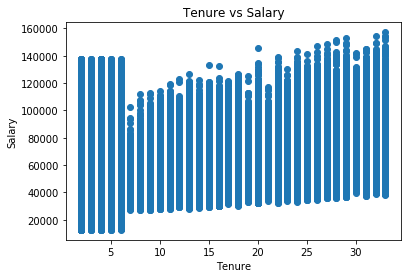

In [12]:
### Draw a scatter plot to identify the relation between employees tenure and salary
X = active_employees_DF.tenure
Y = active_employees_DF.salary
plt.xlabel("Tenure")
plt.ylabel("Salary")
plt.title("Tenure vs Salary")
plt.scatter(X,Y)
plt.show()

In [13]:
active_employees_DF.columns

Index(['emp_no', 'first_name', 'last_name', 'gender', 'birth_date',
       'hire_date', 'dept_no', 'dept_name', 'dept_from_date', 'salary',
       'salary_from_date', 'title', 'title_from_date', 'manager_emp_no',
       'manager_first_name', 'manager_last_name', 'manager_gender',
       'manager_birth_date', 'manager_hire_date', 'manager_from_date', 'age',
       'tenure', 'manager_age', 'manager_tenure', 'salary_since',
       'role_since'],
      dtype='object')

In [14]:
temp = pd.DataFrame(active_employees_DF.age.value_counts(),columns=['age']).reset_index()
temp.columns = ['age','count']
def bar_for_plots(i,tablename):
    one =  make_go_bar( x=temp.age,y=temp[i],text = temp[i],name='{}'.format(i))
    data = [one]
    layout = go.Layout(
    title='{}({})'.format(i,tablename),showlegend=True,xaxis=dict(
        title='Bins',
        showticklabels=True,
        tickangle=0,),)
    fig = go.Figure(data=data,layout=layout)
    return iplot(fig)
for i in temp.columns:
    if i not in ['age']:
        bar_for_plots(i,"active_employees_DF")

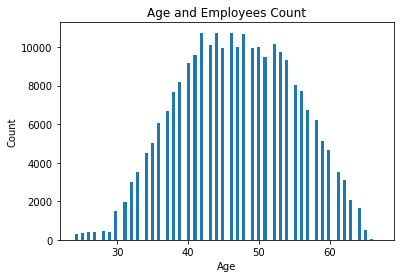

In [15]:
### Draw histogram for the employees count in each age group
plt.xlabel("Age")
plt.ylabel("Count")
plt.title("Age and Employees Count")
plt.hist(active_employees_DF.age,bins=100)
plt.show()

### Draw histogram for the employees count in each age group

In [16]:
trace1 = go.Histogram(x=active_employees_DF.age,marker=dict(
        color='red'
    ),opacity=0.40)
layout = go.Layout(
    title='Histogram of Employee Age')
fig = go.Figure(data=[trace1], layout=layout)
iplot(fig)

### Draw histogram for the employees count by tenure


In [17]:
trace1 = go.Histogram(x=active_employees_DF.tenure,marker=dict(
        color='blue'
    ),opacity=0.80)
layout = go.Layout(
    title='Histogram of Employee Tenure')
fig = go.Figure(data=[trace1], layout=layout)
iplot(fig)

### Draw histogram for the employees count by salary


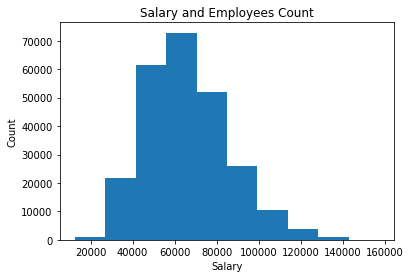

In [18]:
plt.xlabel("Salary")
plt.ylabel("Count")
plt.title("Salary and Employees Count")
plt.hist(active_employees_DF.salary)
plt.show()

### Extract Male and Female employees counts in each department


In [19]:
### Extract Male and Female employees counts in each department
#Y1 = dept_aggr_gender_DF['tot_emp'][dept_aggr_gender_DF['gender'] == 'M']
#Y2 = dept_aggr_gender_DF['tot_emp'][dept_aggr_gender_DF['gender'] == 'F']

In [20]:
dept_aggr_gender_DF.columns

Index(['dept_no', 'dept_name', 'gender', 'tot_emp', 'tot_sal', 'min_sal',
       'max_sal', 'avg_sal', 'min_age', 'max_age', 'avg_age', 'min_tenure',
       'max_tenure', 'avg_tenure', 'avg_sal_change', 'avg_role_change'],
      dtype='object')

In [21]:
per_dept_gender_dist = dept_aggr_gender_DF.groupby(['dept_name','gender','tot_emp']).size().reset_index().iloc[:,:-1]

In [22]:
m = per_dept_gender_dist[per_dept_gender_dist.gender=='M']
f = per_dept_gender_dist[per_dept_gender_dist.gender=='F']

In [23]:
m

,dept_name,gender,tot_emp
1,Analytics,M,2044
3,Customer Service,M,11568
5,Development,M,37789
7,Finance,M,8483
9,Human Resources,M,8725
11,Marketing,M,9952
13,Production,M,32859
15,Quality Management,M,9746
17,Research,M,10266
19,Sales,M,23616


In [24]:
f

,dept_name,gender,tot_emp
0,Analytics,F,1964
2,Customer Service,F,8023
4,Development,F,25513
6,Finance,F,6068
8,Human Resources,F,6129
10,Marketing,F,6812
12,Production,F,22397
14,Quality Management,F,7066
16,Research,F,7157
18,Sales,F,15951


In [25]:
Y2 = m.tot_emp
Y1 = f.tot_emp

In [26]:
# trace1 = go.Bar(
#     x=f.dept_name,
#     y=Y1,text = Y1,
#     name='Female'
# )
trace1 = make_go_bar( x=f.dept_name,
    y=Y1,text = Y1,name = 'Female',
    color='red')

trace2 = make_go_bar( x=m.dept_name,
    y=Y2,text = Y2,name = 'Male',
    color='blue')
# trace2 = go.Bar(
#     x=m.dept_name,
#     y=Y2,text = Y2,
#     name='Male')


data = [trace1, trace2]
layout = go.Layout(
    barmode='group'
)

layout = go.Layout(
    title='{}'.format("Gender Distribution in the Department"),showlegend=True,xaxis=dict(
        title='Bins',
        showticklabels=True,
        tickangle=30,),)

fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='grouped-bar')

